In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from ydata_profiling import ProfileReport
import seaborn as sns
import numpy as np

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

/Users/palomaholgado/opt/anaconda3/lib/python3.9/site-packages/numba/core/decorators.py:262: NumbaDeprecationWarning: numba.generated_jit is deprecated. Please see the documentation at: https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-generated-jit for more information and advice on a suitable replacement.
  warnings.warn(msg, NumbaDeprecationWarning)
/Users/palomaholgado/opt/anaconda3/lib/python3.9/site-packages/visions/backends/shared/nan_handling.py:51: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def hasna(x: np.ndarray) -> bool:


Lectura de los files

In [2]:
X_test_raw = pd.read_csv('Pump_it_Up_Data_Mining_the_Water_Table_-_Test_set_values.csv')
X_train_raw = pd.read_csv('Pump_it_Up_Data_Mining_the_Water_Table_-_Training_set_values.csv')
y_train_raw = pd.read_csv('Pump_it_Up_Data_Mining_the_Water_Table_-_Training_set_labels.csv')

Para limpiar los datos voy a agregarles una columna a los data frames de X_train y X_test que me indique si son datos de training o de test para poder concatenerlos, aplicarles las mismas transformaciones y luego separarlos.

In [3]:
X_test_raw['category'] = 'test'
X_train_raw['category'] = 'train'

In [4]:
X = pd.concat([X_test_raw, X_train_raw],axis=0,ignore_index=True)

In [5]:
X.head()

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,...,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,category
0,50785,0.0,2013-02-04,Dmdd,1996,DMDD,35.290799,-4.059696,Dinamu Secondary School,0,...,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,other,other,test
1,51630,0.0,2013-02-04,Government Of Tanzania,1569,DWE,36.656709,-3.309214,Kimnyak,0,...,soft,good,insufficient,insufficient,spring,spring,groundwater,communal standpipe,communal standpipe,test
2,17168,0.0,2013-02-01,NaN,1567,NaN,34.767863,-5.004344,Puma Secondary,0,...,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,other,other,test
3,45559,0.0,2013-01-22,Finn Water,267,FINN WATER,38.058046,-9.418672,Kwa Mzee Pange,0,...,soft,good,dry,dry,shallow well,shallow well,groundwater,other,other,test
4,49871,500.0,2013-03-27,Bruder,1260,BRUDER,35.006123,-10.950412,Kwa Mzee Turuka,0,...,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,test


Para echar un primer vistazo a los datos voy a utilizar data profiling que brinda un descripción muy completa de las variables del dataset que me sirve para sacar algunas conclusiones preliminares.

In [6]:
profile = ProfileReport(X)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Según la descripción que proporciona el profiling podemos ver que en el dataset tenemos 10 variables numéricas, 29 categóricas y 2 booleanas. Sabemos que aquellas que no son numéricas tendremos que conventrirlas a numéricas, por ejemplo con el método del Label Encoder. 

Entre las variables numéricas se puede ver que hay muchas con una proporción muy alta de ceros, lo cual daría a pensar que los valores núlos están puestos como 0 en vez de vacíos. Tendremos que gestionar estos valores nulos por ejemplo imputando por la media o la mediana. 

Además aquellas variables con una proporción muy alta de valores nulos las descartaría del modelo ya que aunque impute estos valores, la gran cantidad de ceros hará que no se reemplacen por valores "útiles". Entre estas variables estarían: amount_tsh (70% de ceros), num_private (98% de ceros), scheme_name(cerca del 50% de valores nulos).

Algunas variables que a primera vista no brindan información relevante son recorded_by porque tiene el mismo valor para todas las observaciones y num_private ya que está casi compuesta solo por valores nulos.

A su vez llaman la atención los ceros en latitud y longitud ya que los datos son de Tanzania, cuyo territorio no pasa por ninguno de los meridianos.

Para imputar los valores missing de las variables numéricas voy a utilizar la mediana de la variable. Para hacer esto creo la siguiente función que reemplaza los ceros por la mediana de la variable, proporcionando una lista de las mismas. Les voy a aplicar esta imputación a las variables gps_height, population, latitude y longitude, dado que eysas son las variables numéricas continuas que hay en el dataset, no sería correcto reemplazar los ceros de district_code o construction_year con la mediana porque por más de que son numéricas son como categorías, entonces los 0 serían como la categoría "valor desconocido".

In [7]:
def median_imputation(var,value):
    X[var] = X[var].replace(value,X[var].median())

In [8]:
lista_numericas = ['gps_height','population','latitude','longitude']

for i in lista_numericas:
    median_imputation(i,0)

In [9]:
def zeros_amount(var):
    amount = len(X[X[var] == 0])
    print(f"{var}: {amount}")

In [10]:
for i in lista_numericas:
    zeros_amount(i)

gps_height: 0
population: 0
latitude: 0
longitude: 0


Ahora paso a codificar las variables categóricas para pasarlas a númericas con Label Encoder. De esta forma se le asigna a cada categoría un número, incluso a los valores missing.

In [11]:
object_columns = X.select_dtypes(include=['object'])
object_columns = object_columns.columns.tolist()

In [12]:
for i in object_columns:
    le = LabelEncoder()
    X[i] = le.fit_transform(X[i])

Ahora vuelvo a separar los datasets entre train y test. Para esto primero hago un value_counts() simplemente para poder identificar las categorías espues de que el Label Encoder les asigno un número y separo, la categoria más grande como la de train y la más pequeña como la de test.

In [13]:
X.category.value_counts()

1    59400
0    14850
Name: category, dtype: int64

In [14]:
X_train = X[X['category']==1]
X_test = X[X['category']==0]

In [15]:
X_train = X_train.drop('category', axis=1)
X_test = X_test.drop('category', axis=1)

In [16]:
y_train_raw.status_group.value_counts()

functional                 32259
non functional             22824
functional needs repair     4317
Name: status_group, dtype: int64

A partir del value counts de arriba se puede ver que el dataset está desbalanceado, la categoría de "functional needs repair" tiene 5 veces menos observaciones que la de "non functional" y casi 8 veces menos que la de "functional". Puedo probar con técnicas de rebalanceo para ver que el modelo prediga la tercera categoría tan bien como las primeras.

In [17]:
y_train_encoded = y_train_raw.copy()

In [18]:
y_train_encoded['status_group']=y_train_encoded['status_group'].replace({'non functional':0,'functional needs repair':1, 'functional':2})

### Modelo Auto ML como primera aproximación

La idea del Modelo AUTOML es poder tener mayor visibilidad sobre el modelo que mejor se ajusta al dataset que estamos utilizando.

In [19]:
# !pip install pycaret

In [20]:
import pycaret
from pycaret.classification import *

Uno los data frames de X_train e y_train en un único dataframe de datos de entrenamiento. A su vez voy a descartar las variables "id", "num_private", "amount_tsh" y "recorded_by" porque la primera tiene un valor distinto para cada observación, la segunda es 90% ceros, la tarcera tiene 70% deros y la cuarta tiene el mismo valor para todas las observaciones, por ende considero que ninguna de ellas proporciona inforamción relevante. Más adelante haré una selección más profunda de variables en la sección de Feature Engineering.

In [21]:
X_y_train_encoded = pd.merge(X_train, y_train_encoded, on = 'id' , how='left')

In [22]:
X_y_train_encoded=X_y_train_encoded.drop(columns=['id','num_private','amount_tsh','recorded_by'])

In [23]:
model_setup = setup(data=X_y_train_encoded, target='status_group', session_id=1)

,Description,Value
0,Session id,1
1,Target,status_group
2,Target type,Multiclass
3,Original data shape,"(59400, 37)"
4,Transformed data shape,"(59400, 37)"
5,Transformed train set shape,"(41580, 37)"
6,Transformed test set shape,"(17820, 37)"
7,Numeric features,36
8,Preprocess,True
9,Imputation type,simple


In [24]:
best_models = compare_models()

#tardó 40 minutos en correr, si tengo que volver a hacerlo puedo limitar el número de modelos que corre sumando el parámetro n_select
#best_models = compare_models(n_select=5)
#best_models = compare_models(n_select=10)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
rf,Random Forest Classifier,0.8052,0.9063,0.8052,0.7995,0.7990,0.6359,0.6390,2.4090
et,Extra Trees Classifier,0.7949,0.8963,0.7949,0.7895,0.7909,0.6209,0.6222,1.7530
gbc,Gradient Boosting Classifier,0.7533,0.8608,0.7533,0.7581,0.7313,0.5162,0.5385,12.1970
dt,Decision Tree Classifier,0.7393,0.7700,0.7393,0.7413,0.7402,0.5301,0.5302,0.3080
ada,Ada Boost Classifier,0.7221,0.8087,0.7221,0.7098,0.6946,0.4529,0.4728,1.0720
ridge,Ridge Classifier,0.6392,0.0000,0.6392,0.5930,0.6063,0.2848,0.2986,0.0740
lda,Linear Discriminant Analysis,0.6392,0.7092,0.6392,0.6219,0.6093,0.2873,0.3009,0.1630
nb,Naive Bayes,0.6154,0.6876,0.6154,0.6107,0.6065,0.2799,0.2851,0.0720
qda,Quadratic Discriminant Analysis,0.6028,0.7470,0.6028,0.6630,0.6235,0.3329,0.3399,0.1110
lr,Logistic Regression,0.5618,0.6014,0.5618,0.5135,0.4935,0.0905,0.1142,4.6690


Processing:   0%|          | 0/61 [00:00<?, ?it/s]

De la tabla de arriba podemos ver que en principio parecería que el algoritmo que mejor predice el comportamiento de los datos es el del clasificador de Random Forest, con un 80% de aciertos.

In [25]:
model_rf = create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8122,0.9061,0.8122,0.8060,0.8062,0.6493,0.6521
1,0.8153,0.9150,0.8153,0.8076,0.8083,0.6546,0.6576
2,0.8102,0.9110,0.8102,0.8069,0.8037,0.6434,0.6478
3,0.8035,0.9066,0.8035,0.7983,0.7977,0.6329,0.6358
4,0.7999,0.9044,0.7999,0.7944,0.7945,0.6271,0.6296
5,0.8066,0.9091,0.8066,0.8012,0.8012,0.6394,0.6421
6,0.7958,0.9028,0.7958,0.7910,0.7901,0.6185,0.6217
7,0.7997,0.9008,0.7997,0.7926,0.7922,0.6242,0.6278
8,0.8129,0.9057,0.8129,0.8075,0.8061,0.6494,0.6527


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [26]:
tune_model_rf = tune_model(model_rf)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7227,0.8220,0.7227,0.7053,0.6834,0.4377,0.4890
1,0.7222,0.8259,0.7222,0.7071,0.6820,0.4360,0.4902
2,0.7210,0.8235,0.7210,0.7058,0.6808,0.4335,0.4874
3,0.7148,0.8230,0.7148,0.7007,0.6737,0.4200,0.4750
4,0.7051,0.8224,0.7051,0.6902,0.6633,0.4000,0.4537
5,0.7292,0.8233,0.7292,0.7139,0.6905,0.4510,0.5039
6,0.7155,0.8090,0.7155,0.7048,0.6735,0.4203,0.4792
7,0.7126,0.8111,0.7126,0.7029,0.6700,0.4139,0.4738
8,0.7138,0.8164,0.7138,0.7004,0.6722,0.4176,0.4738


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


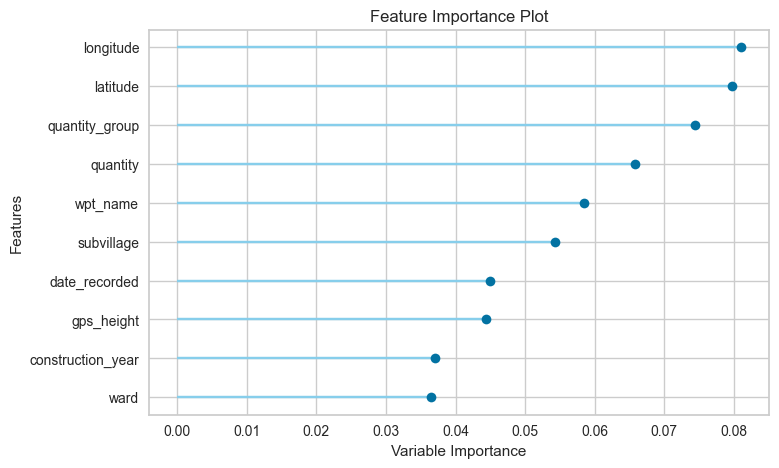

In [27]:
plot_model(tune_model_rf, plot='feature')

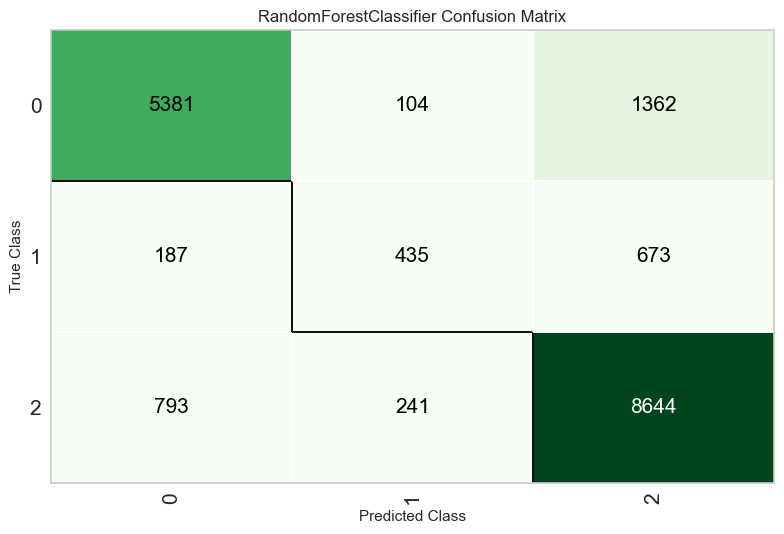

In [28]:
plot_model(tune_model_rf, plot='confusion_matrix')

De la matrix de confusión podemos ver que en general el modelo predice bien tanto las clases de functional (2) como la de non funcional (0), aunque mejor la primera. Falla bastante con la predicción de functional needs repair pero puede ser también debido a que el dataframe está desbalanceado. 

## Random Forest Simple

Intenté correr un modelo de RandomForest simple con el siguiente código pero la computadora se queda sin memoria y jupyter deja de responder. Dejo el código comentado solo de forma ilustrativa.

In [29]:
# rf_simple = RandomForestClassifier().fit(X_train, y_train_raw)

## H2O - Random Forest

Como primer modelo voy a correr un Random Forest utilizando H2O. H2O es útil para trabajar con grandes cantidades de datos ya que tiene uan forma de almacenar y comprimir datos utilizando clusters. Este primer modelo de Random Forest va a ser simple, sin utilizar más hiperparámetros que ntrees y el seed. Más adelante en la sección de grid Search se exploraran más hiperparámetros.

Para empezar, importo la librería de de H2O y dentro de esta librería los estimadores necesarios.

In [30]:
X_y = pd.merge(X_train, y_train_raw, on = 'id' , how='left')

In [31]:
X_y=X_y.drop(columns=['id','num_private','amount_tsh','recorded_by'])

In [32]:
#!pip install h2o

In [33]:
import h2o
from h2o.estimators import H2ORandomForestEstimator
from h2o.estimators import H2OGradientBoostingEstimator

Como segundo paso creo el cluster de H20, indicando que se empleen todos los cores disponibles y que la máxima memoria disponible para el cluster son 6 gigas.

In [34]:
h2o.init(ip = "localhost",
         nthreads = -1,
         max_mem_size = "6g")

Checking whether there is an H2O instance running at http://localhost:54321..... not found.
Attempting to start a local H2O server...
  Java Version: java version "1.8.0_381"; Java(TM) SE Runtime Environment (build 1.8.0_381-b09); Java HotSpot(TM) 64-Bit Server VM (build 25.381-b09, mixed mode)
  Starting server from /Users/palomaholgado/opt/anaconda3/lib/python3.9/site-packages/h2o/backend/bin/h2o.jar
  Ice root: /var/folders/zy/jk1zyh1j2xj3qmvxh6gvy_tm0000gn/T/tmpwo3blu2d
  JVM stdout: /var/folders/zy/jk1zyh1j2xj3qmvxh6gvy_tm0000gn/T/tmpwo3blu2d/h2o_palomaholgado_started_from_python.out
  JVM stderr: /var/folders/zy/jk1zyh1j2xj3qmvxh6gvy_tm0000gn/T/tmpwo3blu2d/h2o_palomaholgado_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,03 secs
H2O_cluster_timezone:,Europe/Madrid
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.42.0.3
H2O_cluster_version_age:,29 days
H2O_cluster_name:,H2O_from_python_palomaholgado_ec65ak
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,5.326 Gb
H2O_cluster_total_cores:,8
H2O_cluster_allowed_cores:,8
H2O_cluster_status:,"locked, healthy"


In [79]:
# Para eliminar los datos del cluster por si ya había sido iniciado.
h2o.remove_all()

Como tercer paso transformo los dataframes de entrenemineto en dataframes de H20.

In [36]:
X_y_train_h2o = h2o.H2OFrame(python_obj = X_y, destination_frame = "X_y_train_h2o")
X_test_h2o = h2o.H2OFrame(python_obj = X_test, destination_frame = "X_test_h2o")

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


Selecciono como variables predictoras todas las columnas del dataframe de training excepto 'status_group' que es mi variable target.

In [37]:
predictors = X_y_train_h2o.drop('status_group').col_names
target = 'status_group'

In [38]:
rf = H2ORandomForestEstimator(ntrees=100, seed=1234)
rf.train(x=predictors, y=target, training_frame=X_y_train_h2o)

drf Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2ORandomForestEstimator : Distributed Random Forest
Model Key: DRF_model_python_1695241765584_1


Model Summary: 
    number_of_trees    number_of_internal_trees    model_size_in_bytes    min_depth    max_depth    mean_depth    min_leaves    max_leaves    mean_leaves
--  -----------------  --------------------------  ---------------------  -----------  -----------  ------------  ------------  ------------  -------------
    100                300                         1.68591e+07            20           20           20            2612          6219          4473.01

ModelMetricsMultinomial: drf
** Reported on train data. **

MSE: 0.15012244253249696
RMSE: 0.3874563750056217
LogLoss: 0.5142671805331739
Mean Per-Class Error: 0.33242234910250895
AUC table was not computed: it is either disabled (model parameter 'auc_type' was set to AUTO or NONE) or the domain size exceeds the limit (maximum is 50 domains).
AUCPR table was not computed: it is either disabled (model parameter 'auc_type' was set to AUTO or NONE) or the domain size exceeds the limit (maximum is 50 domains).

Confusion Matrix: Row labels: Actual class; Column labels: Predicted class
functional    functional needs repair    non functional    Error      Rate
------------  -------------------------  ----------------  ---------  ---------------
29451         594                        2214              0.0870455  2,808 / 32,259
2318          1408                       591               0.673848   2,909 / 4,317
5104          291                        17429             0.236374   5,395 / 22,824
36873         2293                       20234             0.187071   11,112 / 59,400

Top-3 Hit Ratios: 
k    hit_ratio
---  -----------
1    0.812929
2    0.962273
3    1

Scoring History: 
    timestamp            duration    number_of_trees    training_rmse    training_logloss    training_classification_error    training_auc    training_pr_auc
--  -------------------  ----------  -----------------  ---------------  ------------------  -------------------------------  --------------  -----------------
    2023-09-20 22:29:35  0.381 sec   0                  nan              nan                 nan                              nan             nan
    2023-09-20 22:29:37  1.723 sec   1                  0.47685          5.39779             0.250254                         nan             nan
    2023-09-20 22:29:37  2.133 sec   2                  0.463798         4.62211             0.242921                         nan             nan
    2023-09-20 22:29:38  2.545 sec   3                  0.4537           4.07513             0.235053                         nan             nan
    2023-09-20 22:29:38  2.880 sec   4                  0.443548         3.56649             0.22952                          nan             nan
    2023-09-20 22:29:38  3.131 sec   5                  0.433821         3.01219             0.223545                         nan             nan
    2023-09-20 22:29:38  3.402 sec   6                  0.427422         2.61274             0.219231                         nan             nan
    2023-09-20 22:29:39  3.645 sec   7                  0.422326         2.32031             0.215951                         nan             nan
    2023-09-20 22:29:39  3.894 sec   8                  0.417146         2.05591             0.212151                         nan             nan
    2023-09-20 22:29:39  4.108 sec   9                  0.412526         1.78867             0.208995                         nan             nan
    2023-09-20 22:29:39  4.344 sec   10                 0.409051         1.591               0.206994                         nan             nan
    2023-09-20 22:29:44  8.551 sec   21                 0.395159         0.794924            0.195384                         nan             nan
    2023-09-20 22:29:48  12.595 sec  36                 0.390852         0.605863            0.191111                         nan  

In [39]:
predictions = rf.predict(X_test_h2o)

drf prediction progress: |███████████████████████████████████████████████████████| (done) 100%


In [40]:
predictions_h2o =  X_test_h2o.cbind(predictions)[:, ["id", "predict"]]

In [41]:
predictions_h2o_submission = predictions_h2o.as_data_frame()

predictions_h2o_submission = predictions_h2o_submission.rename(columns={'predict': 'status_group'})

predictions_h2o_submission = predictions_h2o_submission.reset_index(drop=True)

predictions_h2o_submission.to_csv('predictions_h2o_submission.csv', index=False)

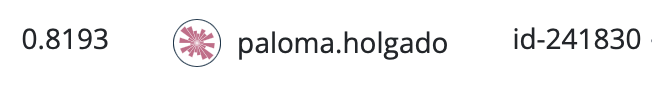

## Feature Engineering

*Feature Engineering* en un término utilizado en proyectos de data science a la mejora de modelos a través de la creación de nuevas variables o agrupación de ellas. 

Voy a empezar mirando la correlación de las variables con la target.

In [44]:
corr = abs(X_y_train_encoded.corr())
corr[['status_group']].sort_values(by = 'status_group',ascending = False).style.background_gradient()

,status_group
status_group,1.000000
waterpoint_type,0.206507
waterpoint_type_group,0.206431
extraction_type_class,0.175338
quality_group,0.153163
quantity_group,0.131425
quantity,0.131425
gps_height,0.124133
extraction_type_group,0.111497
region_code,0.108640


Traigo de nuevo las variables originales (antes de las transformaciones) para mirar mejor las categorías. Voy a empezar mirando waterpoint_type y waterpoint_type_group que son las que mayor correlación tienen con la variable objetivo

In [45]:
X_features = pd.concat([X_test_raw, X_train_raw],axis=0,ignore_index=True)

In [46]:
X_y_features =  pd.merge(X_train_raw, y_train_raw, on = 'id' , how='left')

In [47]:
%matplotlib inline

def compare_graphs(var1, var2):
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))  # 1 row, 2 columns

    ax1 = axes[0]
    grouped_data_type = X_y_features.groupby([var1, 'status_group']).size().unstack()
    grouped_data_type.plot(kind='bar', stacked=True, ax=ax1)
    ax1.legend(title='Status Group')
    ax1.set_xticklabels(grouped_data_type.index, rotation=90)  # Rotate labels for readability

    ax2 = axes[1]
    grouped_data_group = X_y_features.groupby([var2, 'status_group']).size().unstack()
    grouped_data_group.plot(kind='bar', stacked=True, ax=ax2)
    ax2.legend(title='Status Group')
    ax2.set_xticklabels(grouped_data_group.index, rotation=90)  # Rotate labels for readability

    plt.tight_layout()

    plt.show()

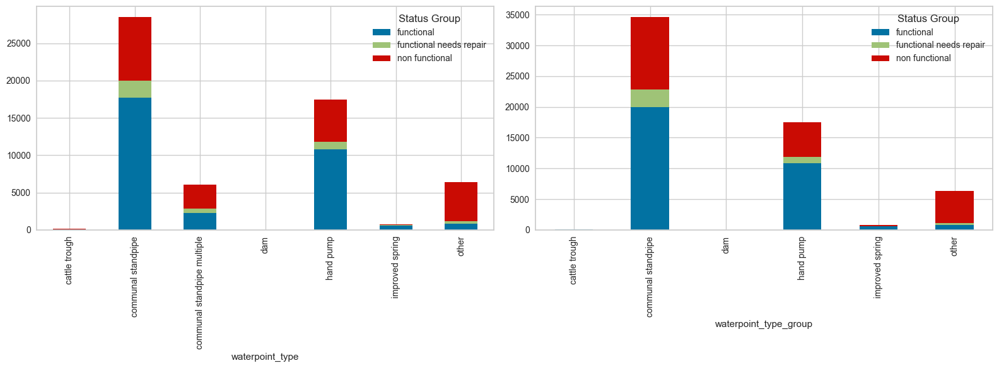

In [48]:
compare_graphs('waterpoint_type','waterpoint_type_group')

Entre ambas variables me voy a quedar con waterpoint_type_group dado que tienen prácticamente las mismas categorías.

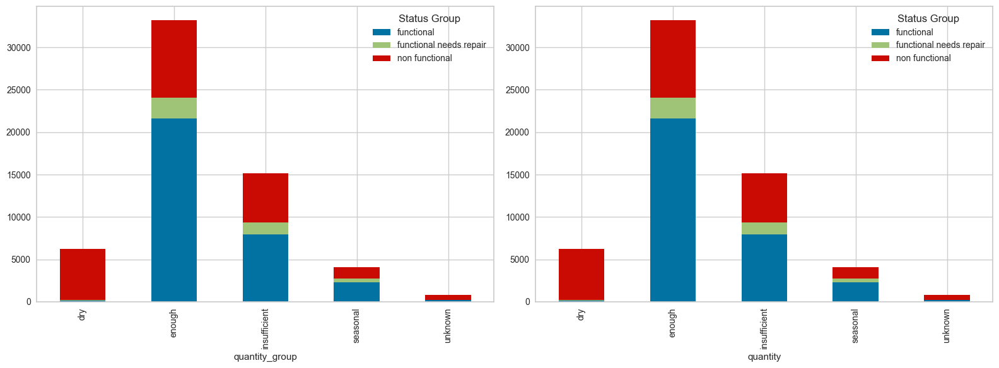

In [49]:
compare_graphs('quantity_group','quantity')

Estas variables son iguales, me quedo con quantity.

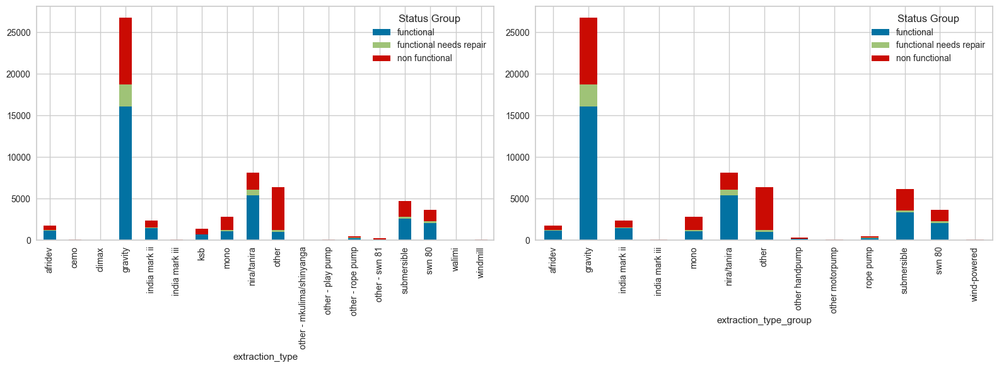

In [50]:
compare_graphs('extraction_type','extraction_type_group')

En este caso me quedo con la variable extraction_type_group porque tiene practicamente las mismas categorías que extraction_type pero reducidas y además tiene mayor correlación con la variable target.

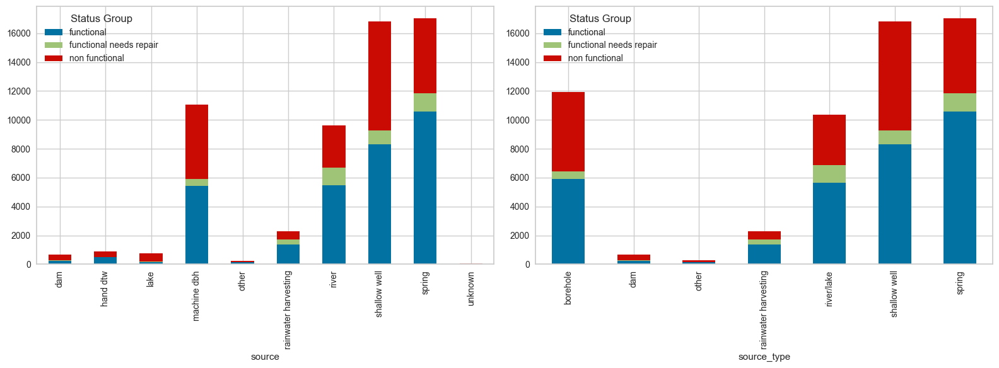

In [51]:
compare_graphs('source','source_type')

En este caso me quedo con source porque las categorías son un tanto diferentes y esta tiene mayor correlación con la variable target.

Para el resto de las variables parecidas voy a seleccionarlas por cual tiene la mejor correlación. Así finalmente me quedo con 'waterpoint_type_group', 'quantity', 'extraction_type_group', 'source', 'payment', 'region_code', 'management'.

Paso a mirar el resto de las variables a ver si puedo aplicar transformaciones que puedan mejorar el modelo.

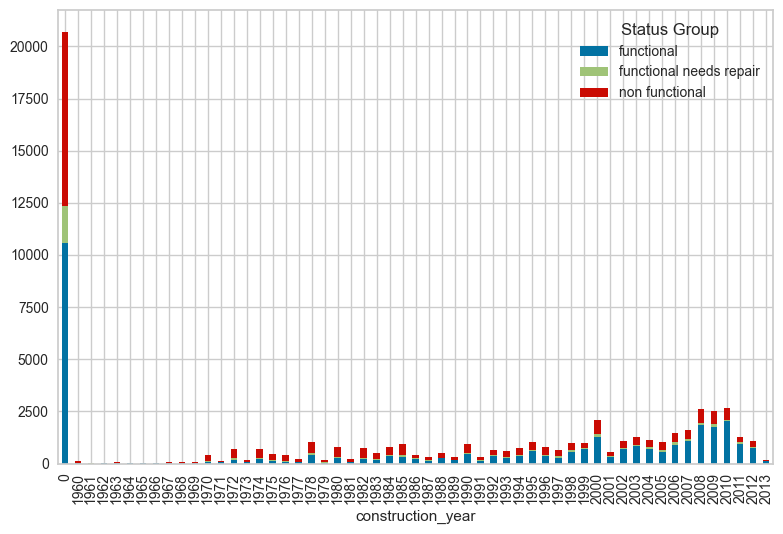

In [52]:
grouped_data_type = X_y_features.groupby(['construction_year', 'status_group']).size().unstack()
grouped_data_type.plot(kind='bar', stacked=True)
plt.legend(title='Status Group')
plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

Puedo intentar crear dos nuevas variables que sean constructed_21_century y constructed_20_century que sean booleanas.

In [53]:
X_y_train_encoded['constructed_20_century'] = X_y_train_encoded['construction_year'].apply(lambda x: 1 if 1960 <= x < 2000 else 0)
X_y_train_encoded['constructed_21_century'] = X_y_train_encoded['construction_year'].apply(lambda x: 1 if x >= 2000 else 0)

También me gustría probar con el logaritmo de la población

In [54]:
X_y_train_encoded['log_population'] = np.log10(X_y_train_encoded['population'])

In [55]:
corr = abs(X_y_train_encoded.corr())
corr[['status_group']].sort_values(by = 'status_group',ascending = False).style.background_gradient()

,status_group
status_group,1.000000
waterpoint_type,0.206507
waterpoint_type_group,0.206431
constructed_21_century,0.187082
extraction_type_class,0.175338
quality_group,0.153163
constructed_20_century,0.150639
quantity_group,0.131425
quantity,0.131425
gps_height,0.124133


Parece que las nuevas variables que cree tienen mejor correlación con la target que las originales, asi que me quedo con estas en vez de las originales. Las creo también en el dataframe X_y y X_test

In [56]:
X_y['constructed_20_century'] = X_y['construction_year'].apply(lambda x: 1 if 1960 <= x < 2000 else 0)
X_y['constructed_21_century'] = X_y['construction_year'].apply(lambda x: 1 if x >= 2000 else 0)

In [57]:
X_y['log_population'] = np.log10(X_y['population'])

In [58]:
X_test['constructed_20_century'] = X_test['construction_year'].apply(lambda x: 1 if 1960 <= x < 2000 else 0)
X_test['constructed_21_century'] = X_test['construction_year'].apply(lambda x: 1 if x >= 2000 else 0)

In [59]:
X_test['log_population'] = np.log10(X_test['population'])

La selección final de variables es:

In [80]:
predictors_selection = ['date_recorded', 'funder', 'gps_height', 'installer', 
                        'longitude', 'latitude', 'basin', 'subvillage', 'region_code', 
                        'district_code', 'lga', 'ward', 'public_meeting', 'scheme_management', 
                        'permit', 'extraction_type_group', 'extraction_type_class', 'management', 
                        'payment', 'water_quality', 'quality_group', 'quantity', 'source', 'source_class', 
                        'waterpoint_type_group', 'constructed_20_century', 'constructed_21_century', 
                        'log_population']
target = 'status_group'

In [81]:
X_y_train_h2o = h2o.H2OFrame(python_obj = X_y, destination_frame = "X_y_train_h2o")
X_test_h2o = h2o.H2OFrame(python_obj = X_test, destination_frame = "X_test_h2o")

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [62]:
predictors = predictors_selection
target = 'status_group'

In [63]:
rf_selection = H2ORandomForestEstimator(ntrees=100, seed=1234)
rf_selection.train(x=predictors, y=target, training_frame=X_y_train_h2o)

drf Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2ORandomForestEstimator : Distributed Random Forest
Model Key: DRF_model_python_1695241765584_2


Model Summary: 
    number_of_trees    number_of_internal_trees    model_size_in_bytes    min_depth    max_depth    mean_depth    min_leaves    max_leaves    mean_leaves
--  -----------------  --------------------------  ---------------------  -----------  -----------  ------------  ------------  ------------  -------------
    100                300                         1.70641e+07            20           20           20            2484          6513          4526.93

ModelMetricsMultinomial: drf
** Reported on train data. **

MSE: 0.1496968343884202
RMSE: 0.38690675154153126
LogLoss: 0.4992570271486219
Mean Per-Class Error: 0.3350523595173514
AUC table was not computed: it is either disabled (model parameter 'auc_type' was set to AUTO or NONE) or the domain size exceeds the limit (maximum is 50 domains).
AUCPR table was not computed: it is either disabled (model parameter 'auc_type' was set to AUTO or NONE) or the domain size exceeds the limit (maximum is 50 domains).

Confusion Matrix: Row labels: Actual class; Column labels: Predicted class
functional    functional needs repair    non functional    Error      Rate
------------  -------------------------  ----------------  ---------  ---------------
29371         641                        2247              0.0895254  2,888 / 32,259
2395          1368                       554               0.683113   2,949 / 4,317
5031          276                        17517             0.232518   5,307 / 22,824
36797         2285                       20318             0.187609   11,144 / 59,400

Top-3 Hit Ratios: 
k    hit_ratio
---  -----------
1    0.812391
2    0.9617
3    1

Scoring History: 
     timestamp            duration    number_of_trees    training_rmse        training_logloss    training_classification_error    training_auc    training_pr_auc
---  -------------------  ----------  -----------------  -------------------  ------------------  -------------------------------  --------------  -----------------
     2023-09-20 22:30:25  0.059 sec   0.0                nan                  nan                 nan                              nan             nan
     2023-09-20 22:30:25  0.452 sec   1.0                0.4775633665923839   5.618782480359498   0.2475325154506042               nan             nan
     2023-09-20 22:30:25  0.680 sec   2.0                0.4649164579404388   4.741204030200127   0.24153880866425992              nan             nan
     2023-09-20 22:30:26  0.900 sec   3.0                0.452110223216325    3.974248954308953   0.23464645097242903              nan             nan
     2023-09-20 22:30:26  1.116 sec   4.0                0.4410931954213675   3.4181740472184527  0.22711320565526924              nan             nan
     2023-09-20 22:30:26  1.307 sec   5.0                0.4321697068435311   2.922799605737291   0.22122018899055046              nan             nan
     2023-09-20 22:30:26  1.540 sec   6.0                0.4256819639502073   2.543529412116301   0.2178128927994254               nan             nan
     2023-09-20 22:30:26  1.748 sec   7.0                0.41984862122409705  2.2337858069976657  0.21493576954041094              nan             nan
     2023-09-20 22:30:27  1.966 sec   8.0                0.415778892528921    2.0060719756844145  0.212996514476999                nan             nan
     2023-09-20 22:30:27  2.208 sec   9.0                0.4116714042982592   1.7780535235706936  0.21061995346927603              nan             nan
---  ---                  ---         ---                ---                  ---                 ---                              ---             ---
     2023-09-20 22:30:28  2.903 sec   12.0               0.4033701109677312   1.2894736460216638  0.20410611693139574              nan             nan
     2023-09-20 22:30:28  3.146 sec   13.0               0.40186

In [64]:
predictions_selection = rf_selection.predict(X_test_h2o)

drf prediction progress: |███████████████████████████████████████████████████████| (done) 100%


In [65]:
predictions_h2o_selection =  X_test_h2o.cbind(predictions_selection)[:, ["id", "predict"]]

In [66]:
predictions_h2o_submission_selection = predictions_h2o_selection.as_data_frame()

predictions_h2o_submission_selection = predictions_h2o_submission_selection.rename(columns={'predict': 'status_group'})

predictions_h2o_submission_selection = predictions_h2o_submission_selection.reset_index(drop=True)

predictions_h2o_submission_selection.to_csv('predictions_h2o_submission_selection.csv', index=False)

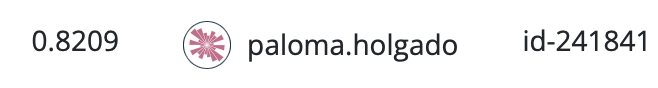

Logramos mejorar las predicciones del modelo!

## H2O Random Forest - Grid Search

Ahora intento mejorar el modelo haciendo grid search con h2o. Hago una lista de opciones para distintos hiperparámetros y el grid search me devuelve la combinación óptima de estos hiperparámetros. El objetivo es probar valores para los hiperparámetros que no sean los que vienen por default con la esperanza de mejorar el modelo y obtener mejores predicciones.

Los hiperparametros que voy a probar son: ntrees, max_depth, min_rows y sample_rate.

Dejo una pequeña descripción de qué significa cada uno:

- ntrees: es el número de árboles de decisión que se crea en el Random Forest. 

- max_depth: representa los niveles a los que puede crecer cada árbol de decisión.

- min_rows: controla el número mínimo de observaciones necesarias para crear un nuevo nodo durante el proceso de construcción de los árboles.

- sample_rate: controla la porción de filas elegidas al azar para entrenar a cada árbol.

In [67]:
from h2o.grid.grid_search import H2OGridSearch

In [68]:
param_grid = {
    'ntrees': [100, 200],
    'max_depth': [10, 20, 30],
    'min_rows': [1, 5, 10],
    'sample_rate': [0.6, 1.0],
    'seed': [1234]
}

In [69]:
grid = H2OGridSearch(H2ORandomForestEstimator(), hyper_params=param_grid)
grid.train(x=predictors_selection, y=target, training_frame=X_y_train_h2o)

drf Grid Build progress: |███████████████████████████████████████████████████████| (done) 100%


,max_depth,min_rows,ntrees,sample_rate,seed,model_ids,logloss
,20.0,1.0,200.0,0.6,1234.0,Grid_DRF_X_y_train_h2o_model_python_1695241765584_3_model_11,0.4765494
,20.0,5.0,200.0,0.6,1234.0,Grid_DRF_X_y_train_h2o_model_python_1695241765584_3_model_14,0.4838582
,30.0,5.0,200.0,0.6,1234.0,Grid_DRF_X_y_train_h2o_model_python_1695241765584_3_model_15,0.4858732
,20.0,5.0,100.0,0.6,1234.0,Grid_DRF_X_y_train_h2o_model_python_1695241765584_3_model_5,0.4892914
,20.0,1.0,100.0,0.6,1234.0,Grid_DRF_X_y_train_h2o_model_python_1695241765584_3_model_2,0.4932467
,30.0,5.0,100.0,0.6,1234.0,Grid_DRF_X_y_train_h2o_model_python_1695241765584_3_model_6,0.4957074
,30.0,10.0,200.0,0.6,1234.0,Grid_DRF_X_y_train_h2o_model_python_1695241765584_3_model_18,0.5002640
,30.0,10.0,100.0,0.6,1234.0,Grid_DRF_X_y_train_h2o_model_python_1695241765584_3_model_9,0.5020394
,20.0,10.0,200.0,0.6,1234.0,Grid_DRF_X_y_train_h2o_model_python_1695241765584_3_model_17,0.5025061
,20.0,10.0,100.0,0.6,1234.0,Grid_DRF_X_y_train_h2o_model_python_1695241765584_3_model_8,0.5032253


In [70]:
best_model = grid.get_grid()[0]
best_hyperparameters = best_model.actual_params

In [71]:
best_hyperparameters

{'model_id': 'Grid_DRF_X_y_train_h2o_model_python_1695241765584_3_model_11',
 'training_frame': 'X_y_train_h2o',
 'validation_frame': None,
 'nfolds': 0,
 'keep_cross_validation_models': True,
 'keep_cross_validation_predictions': False,
 'keep_cross_validation_fold_assignment': False,
 'score_each_iteration': False,
 'score_tree_interval': 0,
 'fold_assignment': None,
 'fold_column': None,
 'response_column': 'status_group',
 'ignored_columns': ['management_group',
  'construction_year',
  'region',
  'waterpoint_type',
  'extraction_type',
  'population',
  'payment_type',
  'quantity_group',
  'scheme_name',
  'wpt_name',
  'source_type'],
 'ignore_const_cols': True,
 'offset_column': None,
 'weights_column': None,
 'balance_classes': False,
 'class_sampling_factors': None,
 'max_after_balance_size': 5.0,
 'max_confusion_matrix_size': 20,
 'ntrees': 200,
 'max_depth': 20,
 'min_rows': 1.0,
 'nbins': 20,
 'nbins_top_level': 1024,
 'nbins_cats': 1024,
 'r2_stopping': 1.797693134862315

Del output de arriba se puede ver que de los valores para los hiperparametros que probé la combinación óptima es 'ntrees': 200, 'max_depth': 20, 'min_rows': 1.0 y 'sample_rate':0.6

Ahora corro el modelo h2o random forest con estos hiperparametros.

In [72]:
rf_params = H2ORandomForestEstimator(ntrees=200, max_depth=20,min_rows=1, sample_rate=0.6,seed=1234)
rf_params.train(x=predictors_selection, y=target, training_frame=X_y_train_h2o)

drf Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2ORandomForestEstimator : Distributed Random Forest
Model Key: DRF_model_python_1695241765584_4


Model Summary: 
    number_of_trees    number_of_internal_trees    model_size_in_bytes    min_depth    max_depth    mean_depth    min_leaves    max_leaves    mean_leaves
--  -----------------  --------------------------  ---------------------  -----------  -----------  ------------  ------------  ------------  -------------
    200                600                         3.30431e+07            20           20           20            2288          6092          4382.67

ModelMetricsMultinomial: drf
** Reported on train data. **

MSE: 0.1491005848546699
RMSE: 0.3861354488449227
LogLoss: 0.47654940494808695
Mean Per-Class Error: 0.33309228282412756
AUC table was not computed: it is either disabled (model parameter 'auc_type' was set to AUTO or NONE) or the domain size exceeds the limit (maximum is 50 domains).
AUCPR table was not computed: it is either disabled (model parameter 'auc_type' was set to AUTO or NONE) or the domain size exceeds the limit (maximum is 50 domains).

Confusion Matrix: Row labels: Actual class; Column labels: Predicted class
functional    functional needs repair    non functional    Error      Rate
------------  -------------------------  ----------------  ---------  ---------------
29448         611                        2200              0.0871385  2,811 / 32,259
2368          1381                       568               0.680102   2,936 / 4,317
5035          261                        17528             0.232036   5,296 / 22,824
36851         2253                       20296             0.185909   11,043 / 59,400

Top-3 Hit Ratios: 
k    hit_ratio
---  -----------
1    0.814091
2    0.963047
3    1

Scoring History: 
    timestamp            duration          number_of_trees    training_rmse    training_logloss    training_classification_error    training_auc    training_pr_auc
--  -------------------  ----------------  -----------------  ---------------  ------------------  -------------------------------  --------------  -----------------
    2023-09-20 23:03:19  0.125 sec         0                  nan              nan                 nan                              nan             nan
    2023-09-20 23:03:42  23.780 sec        1                  0.476304         5.48555             0.248824                         nan             nan
    2023-09-20 23:04:06  47.012 sec        3                  0.451701         3.9756              0.234533                         nan             nan
    2023-09-20 23:04:28  1 min  9.862 sec  6                  0.424317         2.37124             0.217466                         nan             nan
    2023-09-20 23:04:34  1 min 15.770 sec  8                  0.413361         1.79876             0.209451                         nan             nan
    2023-09-20 23:04:39  1 min 20.004 sec  25                 0.391759         0.668738            0.192424                         nan             nan
    2023-09-20 23:04:43  1 min 24.045 sec  42                 0.389199         0.557491            0.189495                         nan             nan
    2023-09-20 23:04:47  1 min 28.301 sec  60                 0.388287         0.520777            0.188737                         nan             nan
    2023-09-20 23:04:51  1 min 32.545 sec  78                 0.387344         0.502769            0.187525                         nan             nan
    2023-09-20 23:04:55  1 min 36.614 sec  94                 0.387052         0.494275            0.186667                         nan             nan
    2023-09-20 23:04:59  1 min 40.844 sec  111                0.386729         0.489362            0.187121                         nan             nan
    2023-09-20 23:05:04  1 min 45.012 sec  127                0.386451         0.485673            0.18665                          nan             nan
    2023-09-20 23:05:08  1 min 49.037 sec  138 

In [73]:
predictions_params = rf_params.predict(X_test_h2o)

drf prediction progress: |███████████████████████████████████████████████████████| (done) 100%


In [74]:
predictions_h2o_params =  X_test_h2o.cbind(predictions_params)[:, ["id", "predict"]]

In [75]:
predictions_h2o_submission_params = predictions_h2o_params.as_data_frame()

predictions_h2o_submission_params = predictions_h2o_submission_params.rename(columns={'predict': 'status_group'})

predictions_h2o_submission_params = predictions_h2o_submission_params.reset_index(drop=True)

predictions_h2o_submission_params.to_csv('predictions_h2o_submission_params.csv', index=False)

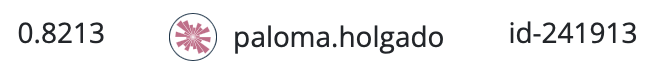

Nuevamente logramos mejorar el modelo!

## H2O Random Forest - Class Balance

Para intentar balancear el dataset, dado que como vimos al principio hay muchas menos observaciones de la categoría 'functional needs repair' comparada con el resto, voy a probar utilizando el método de Class Balance como hiperparametro en el modelo random forest de h2o que corrí anteriormente.

In [82]:
rf_balance = H2ORandomForestEstimator(ntrees=200, max_depth=20,min_rows=1,sample_rate=0.6,balance_classes=True,seed=1234)
rf_balance.train(x=predictors_selection, y=target, training_frame=X_y_train_h2o)

drf Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2ORandomForestEstimator : Distributed Random Forest
Model Key: DRF_model_python_1695241765584_6


Model Summary: 
    number_of_trees    number_of_internal_trees    model_size_in_bytes    min_depth    max_depth    mean_depth    min_leaves    max_leaves    mean_leaves
--  -----------------  --------------------------  ---------------------  -----------  -----------  ------------  ------------  ------------  -------------
    200                600                         3.76818e+07            20           20           20            2980          7357          4997.92

ModelMetricsMultinomial: drf
** Reported on train data. **

MSE: 0.16376501462860388
RMSE: 0.404678903117773
LogLoss: 0.47906608714080273
Mean Per-Class Error: 0.22259829914149876
AUC table was not computed: it is either disabled (model parameter 'auc_type' was set to AUTO or NONE) or the domain size exceeds the limit (maximum is 50 domains).
AUCPR table was not computed: it is either disabled (model parameter 'auc_type' was set to AUTO or NONE) or the domain size exceeds the limit (maximum is 50 domains).

Confusion Matrix: Row labels: Actual class; Column labels: Predicted class
functional    functional needs repair    non functional    Error     Rate
------------  -------------------------  ----------------  --------  ---------------
30013         261                        1985              0.069624  2,246 / 32,259
11715         18610                      1946              0.423321  13,661 / 32,271
5533          108                        26621             0.17485   5,641 / 32,262
47261         18979                      30552             0.222622  21,548 / 96,792

Top-3 Hit Ratios: 
k    hit_ratio
---  -----------
1    0.777378
2    0.972023
3    1

Scoring History: 
    timestamp            duration    number_of_trees    training_rmse    training_logloss    training_classification_error    training_auc    training_pr_auc
--  -------------------  ----------  -----------------  ---------------  ------------------  -------------------------------  --------------  -----------------
    2023-09-20 23:09:34  0.120 sec   0                  nan              nan                 nan                              nan             nan
    2023-09-20 23:09:38  3.448 sec   1                  0.441043         2.71046             0.247959                         nan             nan
    2023-09-20 23:09:39  4.981 sec   2                  0.442351         2.28643             0.258443                         nan             nan
    2023-09-20 23:09:43  9.045 sec   16                 0.408081         0.565138            0.230534                         nan             nan
    2023-09-20 23:09:47  13.065 sec  31                 0.405077         0.499844            0.224037                         nan             nan
    2023-09-20 23:09:51  17.168 sec  47                 0.405128         0.491129            0.223159                         nan             nan
    2023-09-20 23:09:55  21.345 sec  63                 0.40574          0.488403            0.223562                         nan             nan
    2023-09-20 23:09:59  25.346 sec  78                 0.406113         0.486443            0.224657                         nan             nan
    2023-09-20 23:10:04  29.413 sec  94                 0.405561         0.483672            0.22383                          nan             nan
    2023-09-20 23:10:08  33.518 sec  109                0.405569         0.48292             0.2235                           nan             nan
    2023-09-20 23:10:12  37.708 sec  125                0.405144         0.481003            0.222467                         nan             nan
    2023-09-20 23:10:16  41.848 sec  141                0.404721         0.479207            0.222053                         nan             nan
    2023-09-20 23:10:20  45.987 sec  157                0.404588         0.478938            0.22227                          nan      

In [83]:
predictions_balance = rf_balance.predict(X_test_h2o)

drf prediction progress: |███████████████████████████████████████████████████████| (done) 100%


In [84]:
predictions_h2o_balance =  X_test_h2o.cbind(predictions_balance)[:, ["id", "predict"]]

In [85]:
predictions_h2o_submission_balance = predictions_h2o_balance.as_data_frame()

predictions_h2o_submission_balance = predictions_h2o_submission_balance.rename(columns={'predict': 'status_group'})

predictions_h2o_submission_balance = predictions_h2o_submission_balance.reset_index(drop=True)

predictions_h2o_submission_balance.to_csv('predictions_h2o_submission_balance.csv', index=False)

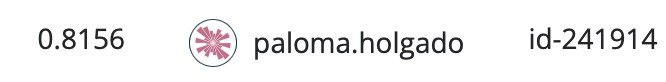

En este caso no dio tan bien como antes.

## XgBoost

Por último intentaré con un modelo XgBoost.

In [86]:
from h2o.estimators import H2OXGBoostEstimator

In [87]:
xgb_model = H2OXGBoostEstimator(ntrees=200,seed=1234)

In [88]:
xgb_model.train(x=predictors_selection, y=target, training_frame=X_y_train_h2o)

xgboost Model Build progress: |██████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2OXGBoostEstimator : XGBoost
Model Key: XGBoost_model_python_1695241765584_7


Model Summary: 
    number_of_trees
--  -----------------
    200

ModelMetricsMultinomial: xgboost
** Reported on train data. **

MSE: 0.10112664880475543
RMSE: 0.3180041647600789
LogLoss: 0.32333960560081115
Mean Per-Class Error: 0.22840010059770344
AUC table was not computed: it is either disabled (model parameter 'auc_type' was set to AUTO or NONE) or the domain size exceeds the limit (maximum is 50 domains).
AUCPR table was not computed: it is either disabled (model parameter 'auc_type' was set to AUTO or NONE) or the domain size exceeds the limit (maximum is 50 domains).

Confusion Matrix: Row labels: Actual class; Column labels: Predicted class
functional    functional needs repair    non functional    Error      Rate
------------  -------------------------  ----------------  ---------  --------------
30946         202                        1111              0.0407018  1,313 / 32,259
1747          2188                       382               0.493167   2,129 / 4,317
3327          127                        19370             0.151332   3,454 / 22,824
36020         2517                       20863             0.116094   6,896 / 59,400

Top-3 Hit Ratios: 
k    hit_ratio
---  -----------
1    0.883906
2    0.98601
3    1

Scoring History: 
     timestamp            duration          number_of_trees    training_rmse        training_logloss     training_classification_error    training_auc    training_pr_auc
---  -------------------  ----------------  -----------------  -------------------  -------------------  -------------------------------  --------------  -----------------
     2023-09-20 23:11:00  0.069 sec         0.0                0.6666666567325278   1.098612258865668    0.6157575757575757               nan             nan
     2023-09-20 23:11:01  0.910 sec         1.0                0.6037038577288463   0.9307154392714933   0.266026936026936                nan             nan
     2023-09-20 23:11:01  1.481 sec         2.0                0.5599626878132232   0.8308467061406871   0.2696969696969697               nan             nan
     2023-09-20 23:11:02  2.018 sec         3.0                0.5288756073854672   0.7646146360059977   0.2658922558922559               nan             nan
     2023-09-20 23:11:02  2.534 sec         4.0                0.5069962229096809   0.7190403502472267   0.263030303030303                nan             nan
     2023-09-20 23:11:03  3.061 sec         5.0                0.49092785362141667  0.6853735858067189   0.258047138047138                nan             nan
     2023-09-20 23:11:03  3.585 sec         6.0                0.4787846317577851   0.6594892063539899   0.25491582491582493              nan             nan
     2023-09-20 23:11:04  4.113 sec         7.0                0.46917292414735234  0.6390777179000559   0.24902356902356904              nan             nan
     2023-09-20 23:11:08  8.584 sec         16.0               0.4307849178141663   0.5544339617742979   0.22713804713804714              nan             nan
     2023-09-20 23:11:13  12.956 sec        25.0               0.41573653395388843  0.5207648759280051   0.21175084175084175              nan             nan
---  ---                  ---               ---                ---                  ---                  ---                              ---             ---
     2023-09-20 23:12:04  1 min  3.742 sec  128.0              0.3445524619170587   0.371399140215786    0.14183501683501684              nan             nan
     2023-09-20 23:12:08  1 min  7.785 sec  136.0              0.34154741851196974  0.36567064443001124  0.1394949494949495               nan             nan
     2023-09-20 23:12:12  1 min 11.894 sec  144.0              0.3381281776299809   0.3593585292081929   0.13560606060606062              nan             nan
     2023-09-20 23:12:16  1 min 16.008 sec  152.0              0.334849005

In [89]:
predictions_xgboost = xgb_model.predict(X_test_h2o)

xgboost prediction progress: |███████████████████████████████████████████████████| (done) 100%


In [90]:
predictions_xgboost =  X_test_h2o.cbind(predictions_xgboost)[:, ["id", "predict"]]

In [91]:
predictions_xgboost = predictions_xgboost.as_data_frame()

predictions_xgboost = predictions_xgboost.rename(columns={'predict': 'status_group'})

predictions_xgboost = predictions_xgboost.reset_index(drop=True)

predictions_xgboost.to_csv('predictions_xgboost.csv', index=False)

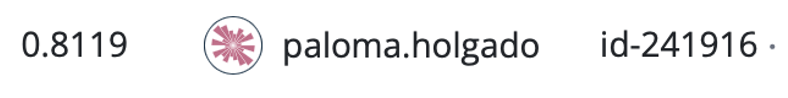

No logramos mejorar el modelo uevamente pero era de esperarse que el XgBoost no diera tan buenas predicciones como el Random Forest como nos lo había anticipado el AutoML que corrimos al principio con Pycaret.

In [92]:
h2o.cluster().shutdown()

H2O session _sid_8524 closed.


## Conclusión

El mejor modelo obtenido es el Random Forest (hecho con h2o), que incluye la selección de variables y las nuevas variables explicadas en la sección de Feature Engineering y los hiperparámetros obtenidos a partir del Grid Search detallado en la sección de H2O Random Forest - Grid Search.